# VISUALISASI DATA (PRAKTIKUM 1)

In [5]:
import numpy as np 
import pandas as pd 

import os

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("C:/Users/Awanda/Documents/athlete_events.csv")
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [3]:
print("There are {} unique sports thus far, in Olympics". format(data["Sport"].nunique()))

There are 66 unique sports thus far, in Olympics


In [4]:
data.groupby("Sport")["Year"].min().sort_values().reset_index()

,Sport,Year
0,Wrestling,1896
1,Weightlifting,1896
2,Athletics,1896
3,Gymnastics,1896
4,Tennis,1896
...,...,...
61,Snowboarding,1998
62,Taekwondo,2000
63,Trampolining,2000
64,Triathlon,2000


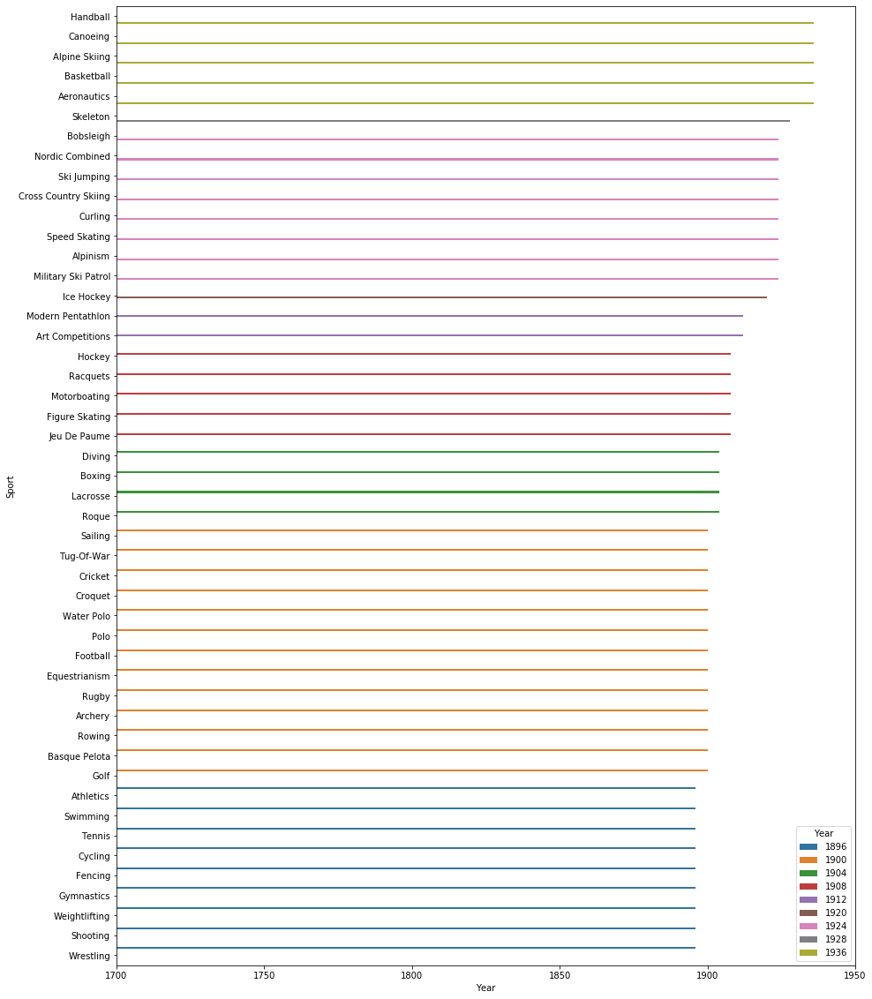

In [6]:
data_sports = data[data["Year"]<1950].groupby("Sport")["Year"].min().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15,20))
plt.xlim(1700,1950)
sns.barplot(x = "Year", y = "Sport", hue="Year", data=data_sports)  
plt.show()

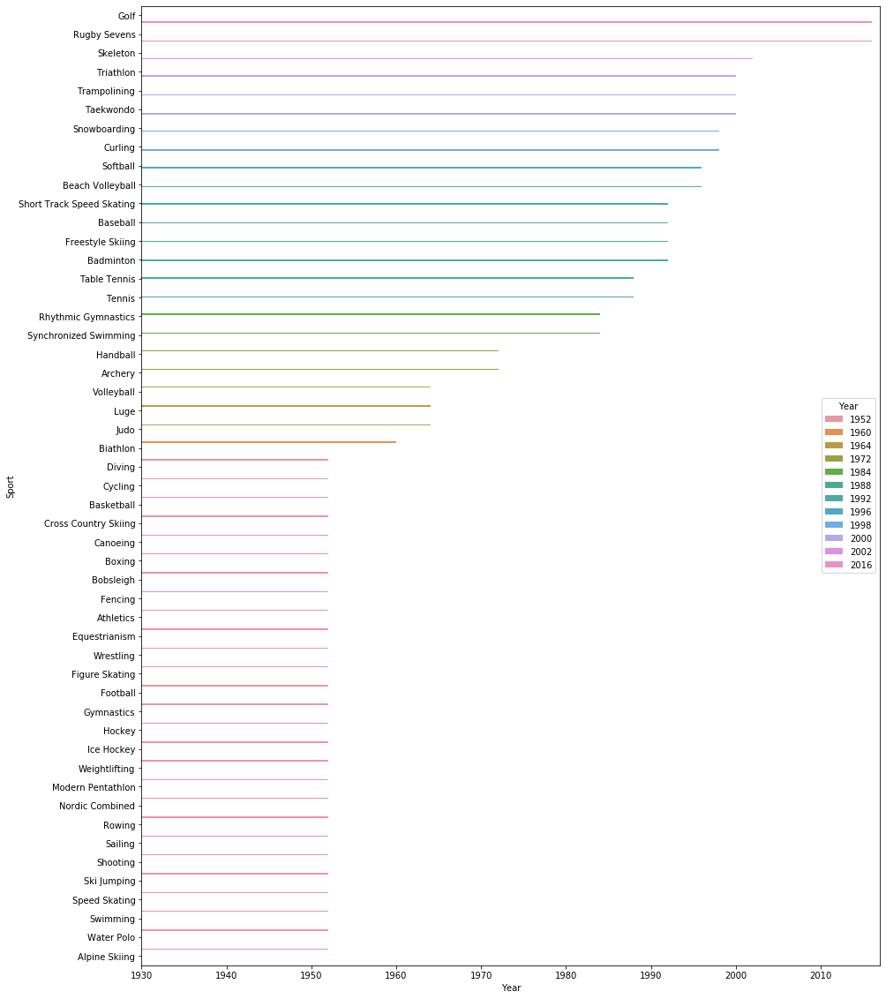

In [7]:
data_sports = data[data["Year"]>=1950].groupby("Sport")["Year"].min().sort_values(ascending=False).reset_index()
plt.figure(figsize=(15,20))
plt.xlim(1930,2017)
sns.barplot(x = "Year", y = "Sport", hue="Year", data=data_sports)
plt.show()

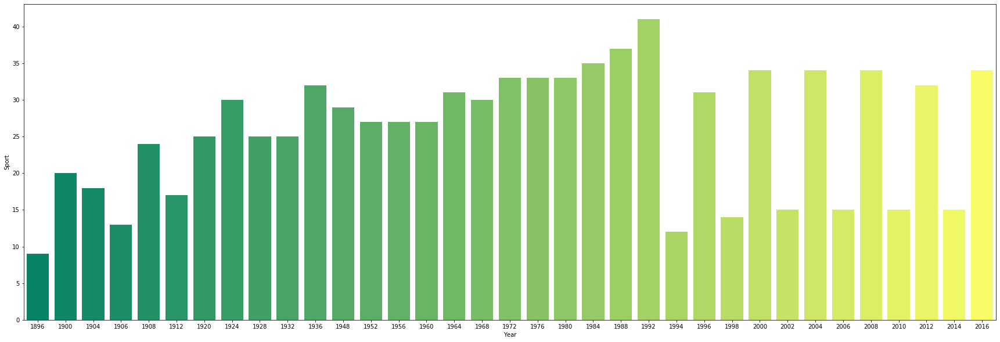

In [8]:
data_sports = data.groupby("Year")["Sport"].nunique().sort_values(ascending=False).reset_index()
fig = plt.figure(figsize=(30,10))
fig.add_subplot(111)
sns.barplot(x = "Year", y = "Sport", data=data_sports, palette="summer", saturation=5 )

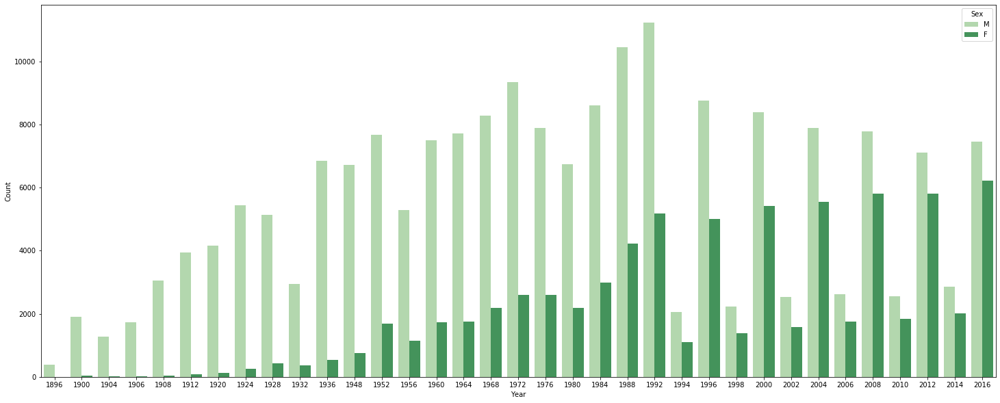

In [9]:
data_sports = data.groupby(["Year","Sex"])["Sport"].count().reset_index().rename(columns={"Sport":"Count"})
plt.figure(figsize=(25,10))
sns.barplot(x="Year", y = "Count", hue = "Sex", data = data_sports, palette = "Greens" )

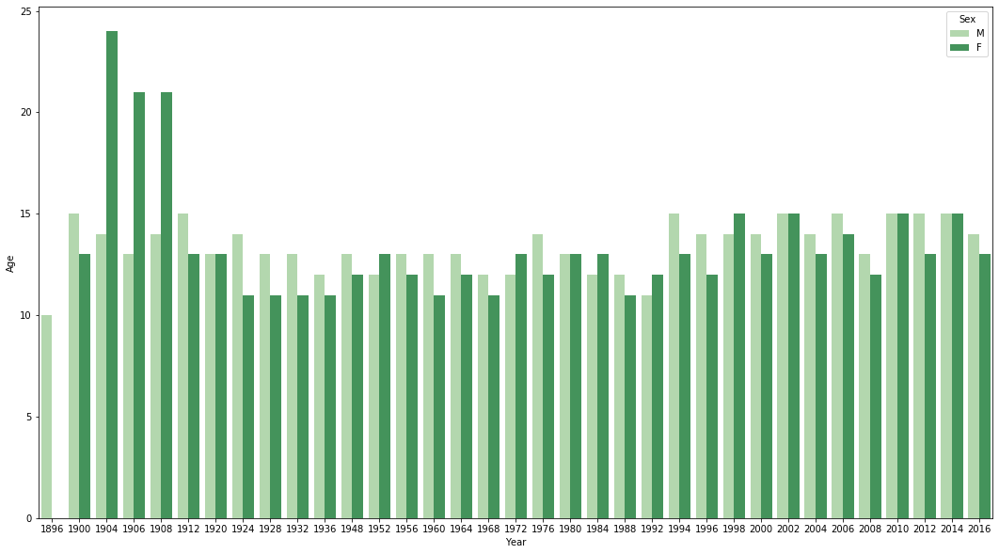

In [10]:
data_sports = data.groupby(["Year","Sex"])["Age"].min().reset_index()
plt.figure(figsize=(40,10))
plt.subplot(121)
sns.barplot(x="Year", y = "Age", hue = "Sex", data = data_sports, palette = "Greens" )

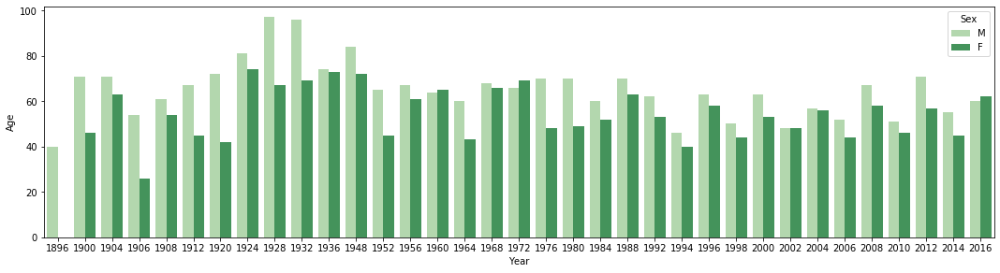

In [11]:
data_sports = data.groupby(["Year","Sex"])["Age"].max().reset_index()
plt.figure(figsize=(40,10))
plt.subplot(221)
sns.barplot(x="Year", y = "Age", hue = "Sex", data = data_sports, palette = "Greens" )

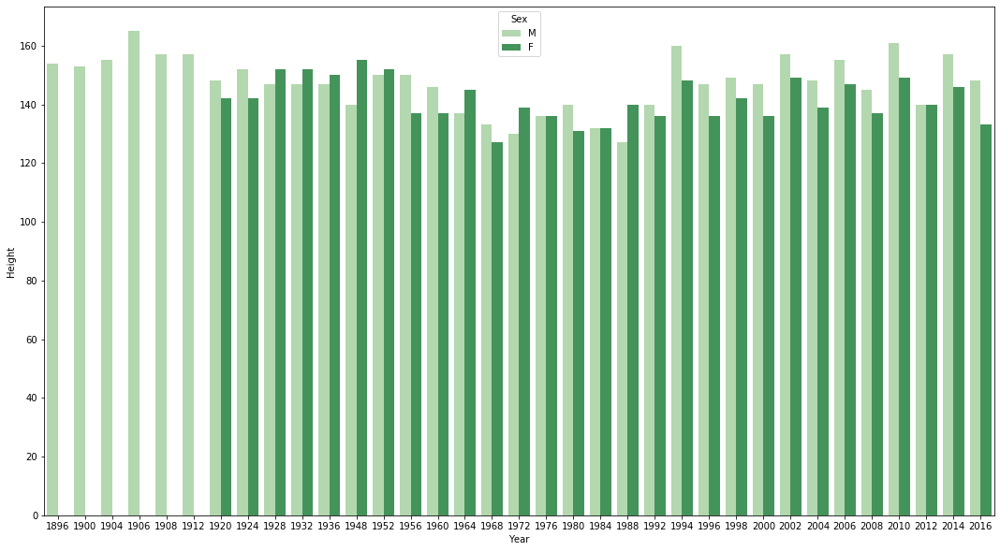

In [12]:
data_sports = data.groupby(["Year","Sex"])["Height"].min().reset_index()
plt.figure(figsize=(40,10))
plt.subplot(121)
sns.barplot(x="Year", y = "Height", hue = "Sex", data = data_sports, palette = "Greens" )

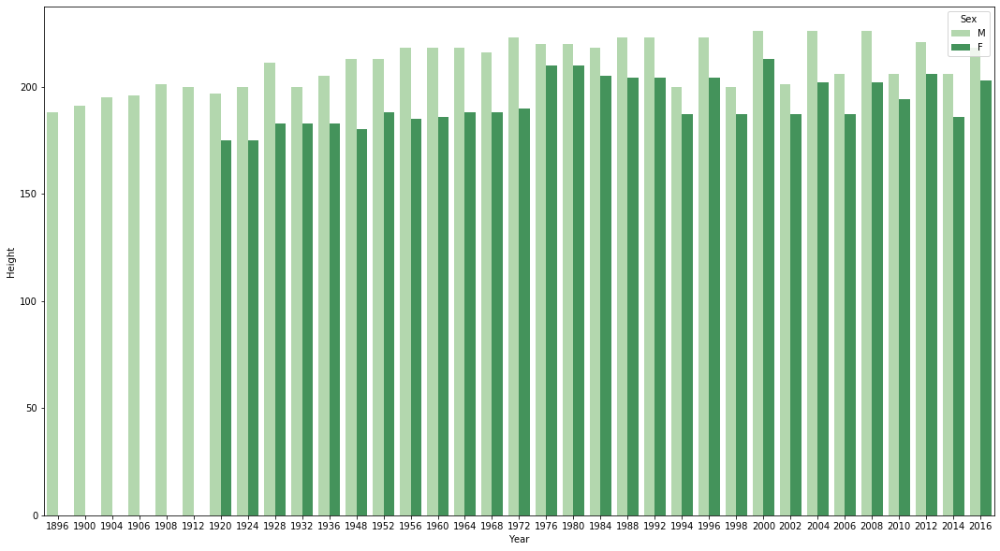

In [13]:
data_sports = data.groupby(["Year","Sex"])["Height"].max().reset_index()
plt.figure(figsize=(40,10))
plt.subplot(121)
sns.barplot(x="Year", y = "Height", hue = "Sex", data = data_sports, palette = "Greens" )

Text(0.5, 1.0, 'Age Distribution of Gold Medalist')

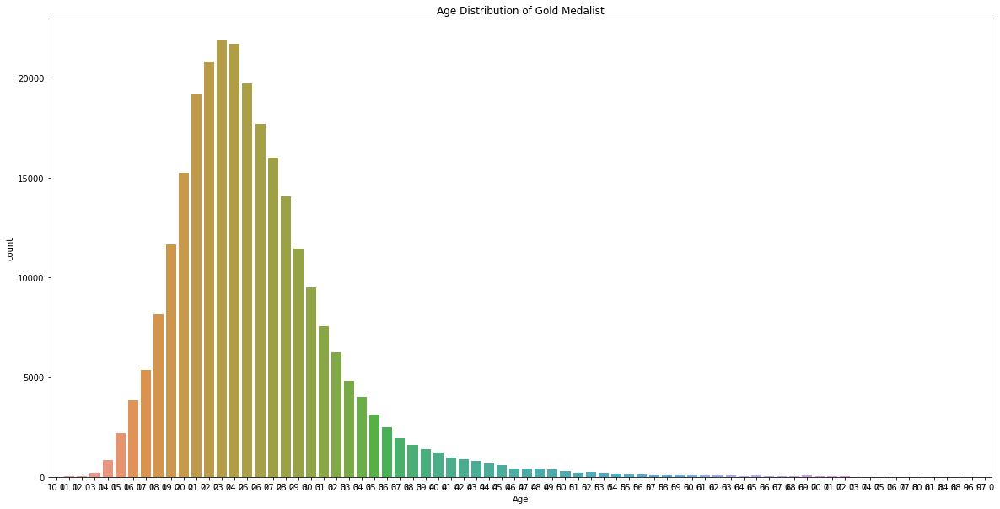

In [14]:
data1 = data[data['Age'].notnull()]

plt.figure(figsize=(20,10))
plt.tight_layout()
sns.countplot(data['Age'])
plt.title("Age Distribution of Gold Medalist")

Text(0.5, 1.0, 'Gold Medals for Athletes above 45')

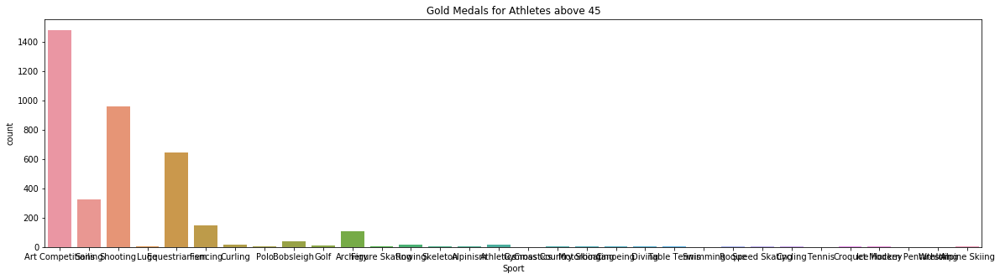

In [15]:
plt.figure(figsize=(20, 5))
plt.tight_layout()
sns.countplot(data['Sport'][data['Age'] > 45])
plt.title('Gold Medals for Athletes above 45')

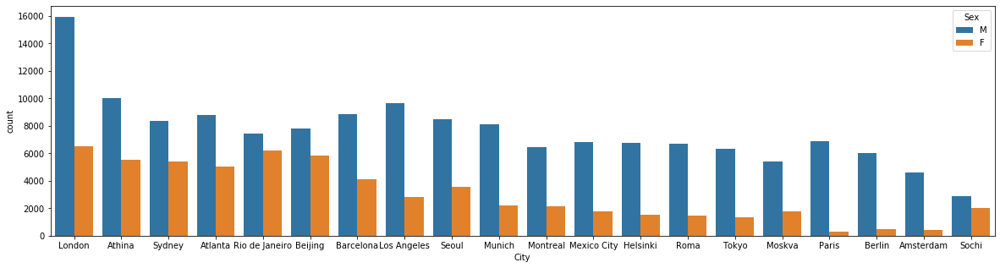

In [16]:
plt.figure(figsize=(20,5))

sns.countplot(x='City',hue = 'Sex',data = data,order=data['City'].value_counts().iloc[:20].index)

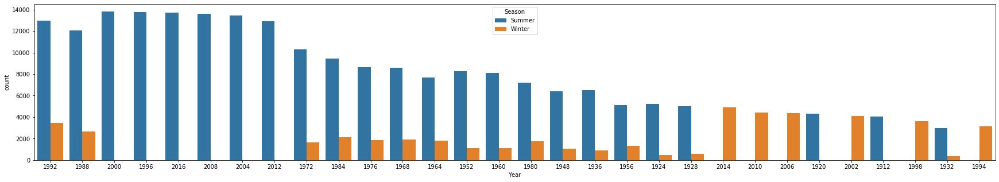

In [17]:
plt.figure(figsize=(30,5))
sns.countplot(x='Year',hue = 'Season',data = data,order=data['Year'].value_counts().iloc[:30].index)

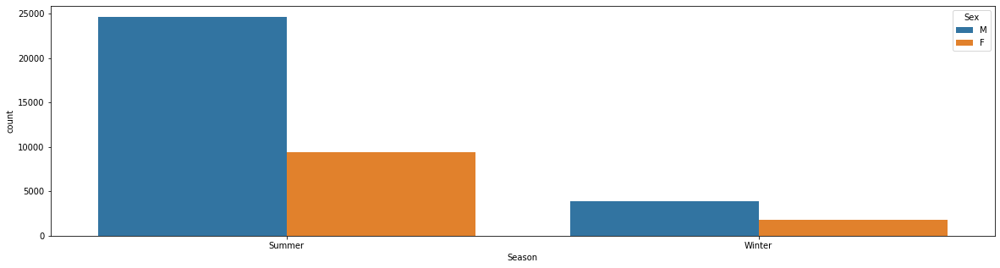

In [18]:
medalData = data[data['Medal'].notnull()]
plt.figure(figsize=(20,5))
sns.countplot(x='Season',hue = 'Sex',data=medalData,order=medalData['Season'].value_counts().iloc[:15].index)

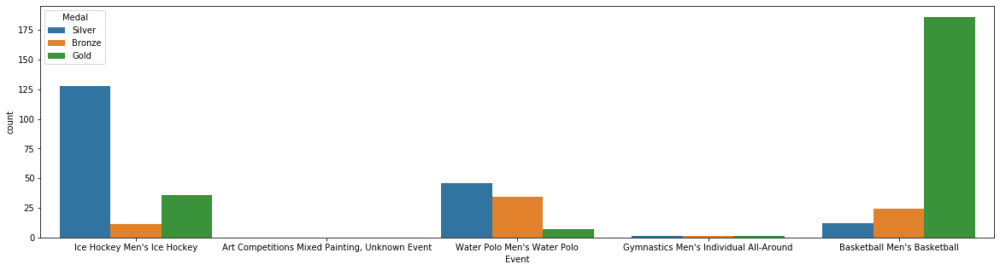

In [19]:
usa_medals = data[data['NOC']=='USA']
usa_medals['Event'].value_counts().head(10)
plt.figure(figsize=(20,5))
sns.countplot(x='Event',hue = 'Medal',data=usa_medals,order=usa_medals['Event'].value_counts().iloc[:5].index)

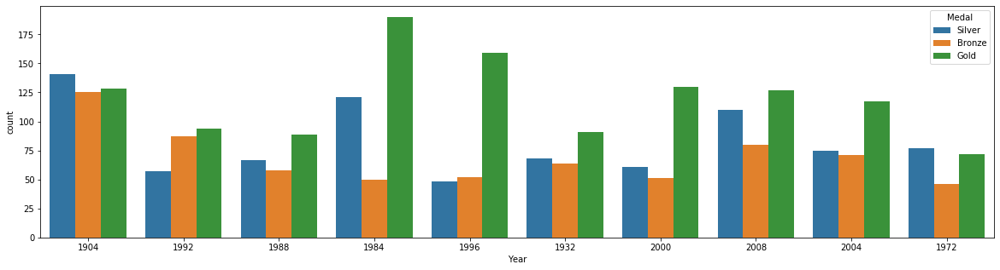

In [20]:
plt.figure(figsize=(20,5))
sns.countplot(x='Year',hue = 'Medal',data=usa_medals,order=usa_medals['Year'].value_counts().iloc[:10].index)

In [21]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools
import plotly.tools as tls
import squarify

In [22]:
fig = {
  "data": [
    {
      "values": data['Sex'].value_counts(),
      "labels": [
        "Male",
        "Female",
      ],
        'marker': {'colors': ['rgb(175, 49, 35)',
                                  'rgb(177, 180, 34)']},
      "name": "Sex Ratio of Participants",
      "hoverinfo":"label+percent+name",
      "hole": .4,
      "type": "pie"
    }],
     "layout": {
        "title":"Sex Ratio of Participants"
     }
}
iplot(fig, filename='donut')

In [23]:
y0 = data.ix[data['Sex']=='M']['Age']
y1 = data.ix[data['Sex']=='F']['Age']

trace0 = go.Box(
    y=y0,
    name="Age Distribution for Male")
trace1 = go.Box(
    y=y1,
    name="Age Distribution for Female")
data = [trace0, trace1]
iplot(data)

C:\Users\Awanda\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

C:\Users\Awanda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated



In [42]:
data = pd.read_csv("C:/Users/Awanda/Documents/athlete_events.csv")
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [43]:
import numpy as np
import pandas as pd

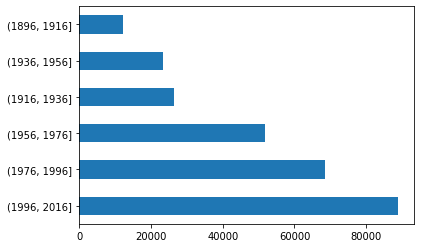

In [53]:
categ = pd.cut(data.Year,[1896,1916,1936,1956,1976,1996,2016])
pd.value_counts(categ).plot(kind='barh');

C:\Users\Awanda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



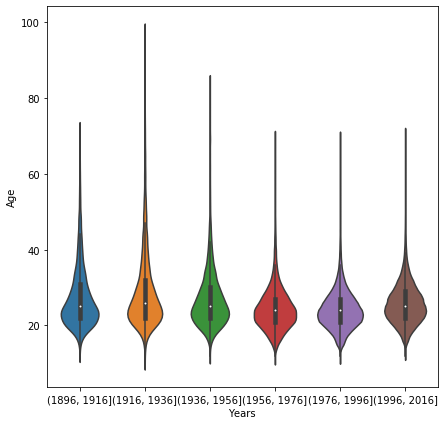

In [54]:
dat_new = data[['ID','Sex','Age','Height','Weight','NOC','Season','Sport','Medal']]
dat_new['Years'] = categ
plt.figure(figsize=(7,7))
#sns.boxplot(x='Years',y='Age',data=dat_new, width=0.7);
sns.violinplot(x='Years',y='Age',data=dat_new, width=0.7);

In [57]:
import random
import scipy.stats as stt
import warnings
warnings.filterwarnings('ignore')
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [58]:
dat = dat_new.dropna()
sample = []
for j in range(6):
        sample.append(dat[dat.Years==dat.Years.unique()[j]].Age.values)
stt.f_oneway(*sample)

F_onewayResult(statistic=130.81222769354443, pvalue=1.3400193045770828e-137)

F_onewayResult(statistic=2.832810516849116, pvalue=0.014615853947556753)


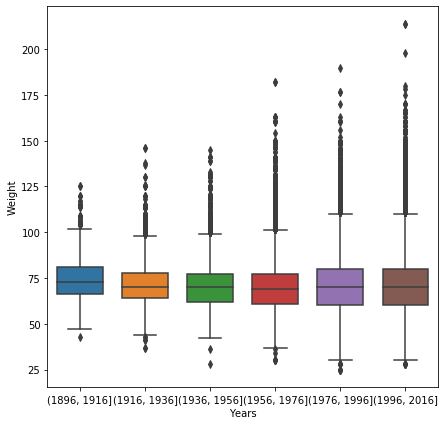

In [59]:
dat_new = data[['ID','Sex','Age','Height','Weight','NOC','Season','Sport','Medal']]
dat_new['Years'] = categ
plt.figure(figsize=(7,7))
sns.boxplot(x='Years',y='Weight',data=dat_new, width=0.7);
#sns.swarmplot(x='Years',y='Age',data=dat_new);
sample = []
for j in range(6):
        sample.append(dat[dat.Years==dat.Years.unique()[j]].Weight.values)
print(stt.f_oneway(*sample))

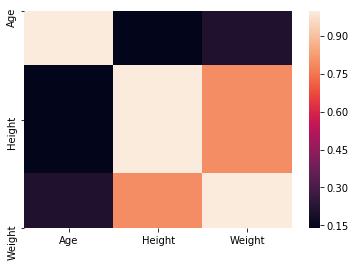

In [60]:
sns.heatmap(data[['Age','Height','Weight']].corr());

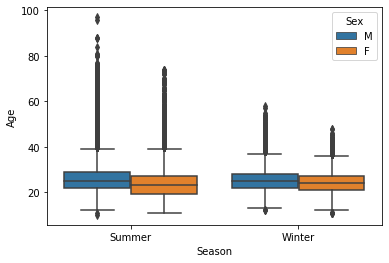

In [61]:
sns.boxplot(x='Season',y='Age',hue='Sex',data=data);

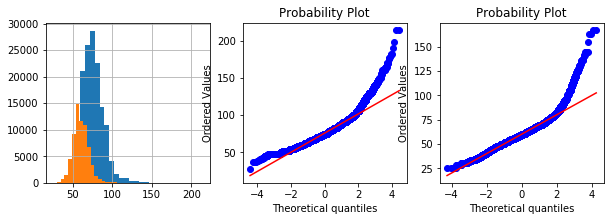

In [62]:
mal_weig = data.Weight[data.Sex=='M'].dropna()
fem_weig = data.Weight[data.Sex=='F'].dropna()
fig = plt.figure(figsize=(10,10))
fig.add_subplot(3,3,1)
mal_weig.hist(bins=30)
fem_weig.hist(bins=30)
fig.add_subplot(3,3,2)
stt.probplot(mal_weig, plot=pylab);
fig.add_subplot(3,3,3)
stt.probplot(fem_weig, plot=pylab);

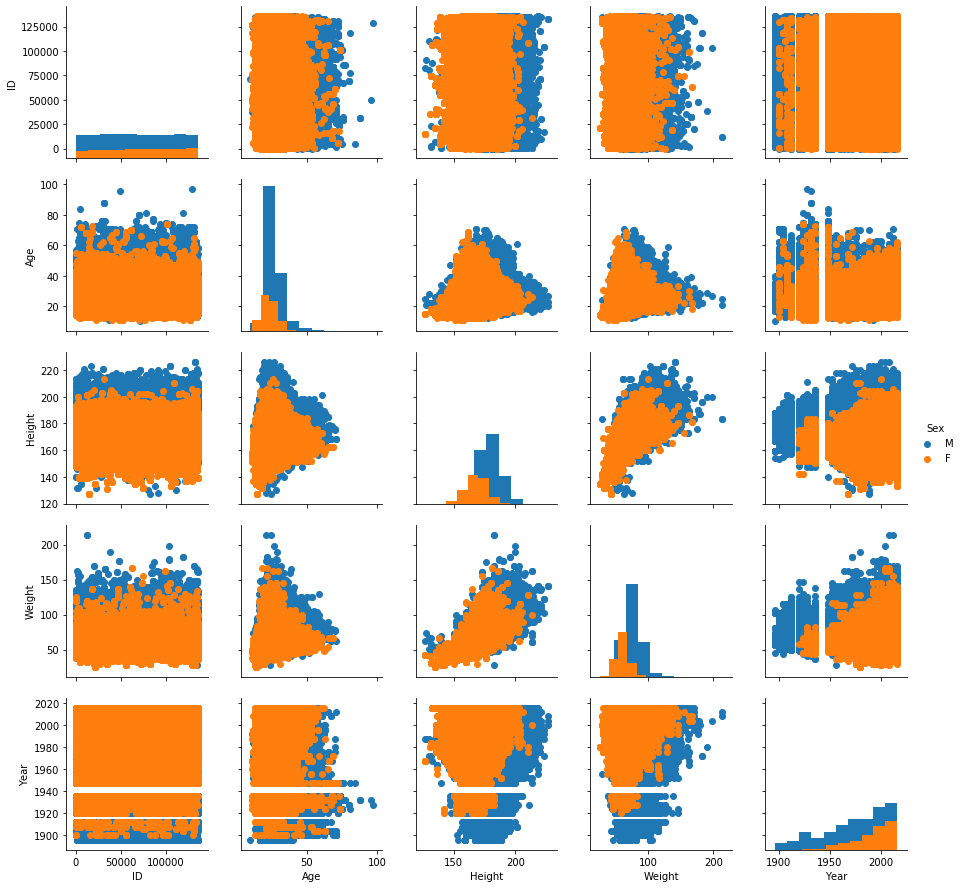

In [64]:
Sex = data['Sex'].value_counts()
g = sns.PairGrid(data, hue="Sex")
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend() #keterangan
plt.show()

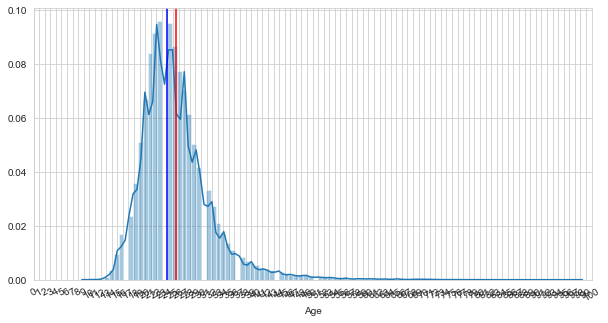

In [107]:
import matplotlib.ticker as ticker

sns.set_style("whitegrid")
plt.figure(figsize=(10,5))
plotd = sns.distplot(data[(data['Age']>0) & (data['Age'] < 100)]['Age'], kde=True, bins=100)

tick_spacing=1 # set spacing for each tick
plotd.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plotd.set_xlim([0, 100]) # do not show negative values 
plt.xticks(rotation=30) # rotate x ticks by 30 degrees
plt.axvline(data[(data['Age']>0) & (data['Age'] < 100)]['Age'].mean(), c='red')
plt.axvline(data[(data['Age']>0) & (data['Age'] < 100)]['Age'].median(), c='blue')
plt.show()

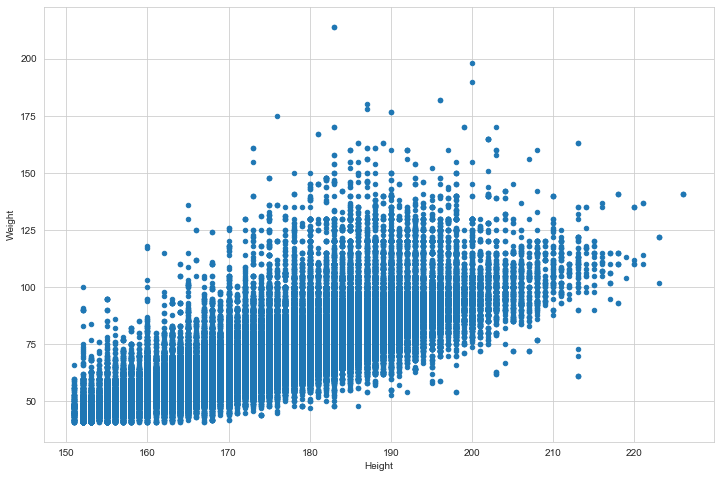

In [71]:
data[data['Height']>150][data['Weight']>40].plot.scatter(x='Height', y='Weight',figsize=(12,8))
plt.show()

In [72]:
import folium

Text(0.5, 1.0, 'Variation of Age')

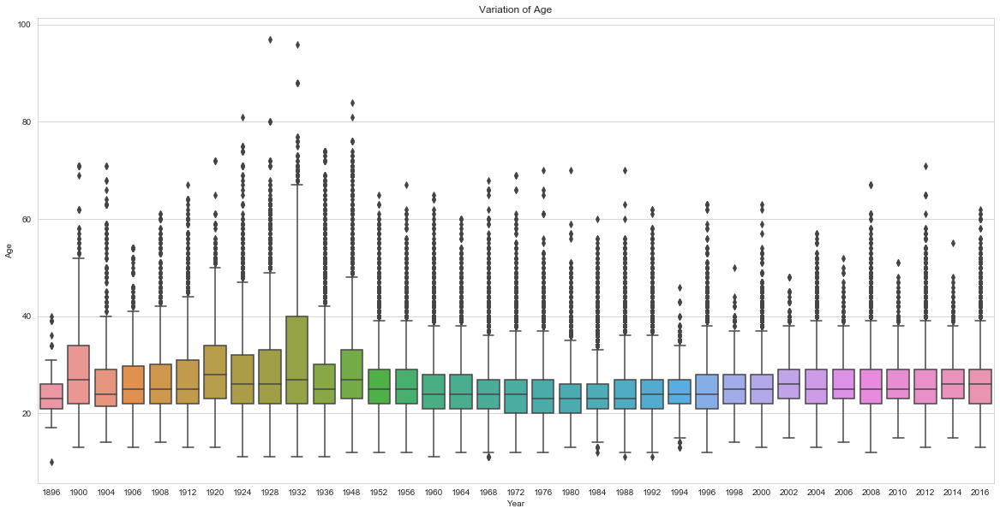

In [78]:
plt.figure(figsize=(20, 10))
sns.boxplot('Year', 'Age', data=data)
plt.title('Variation of Age')

Text(0.5, 1.0, 'Variation of Weight')

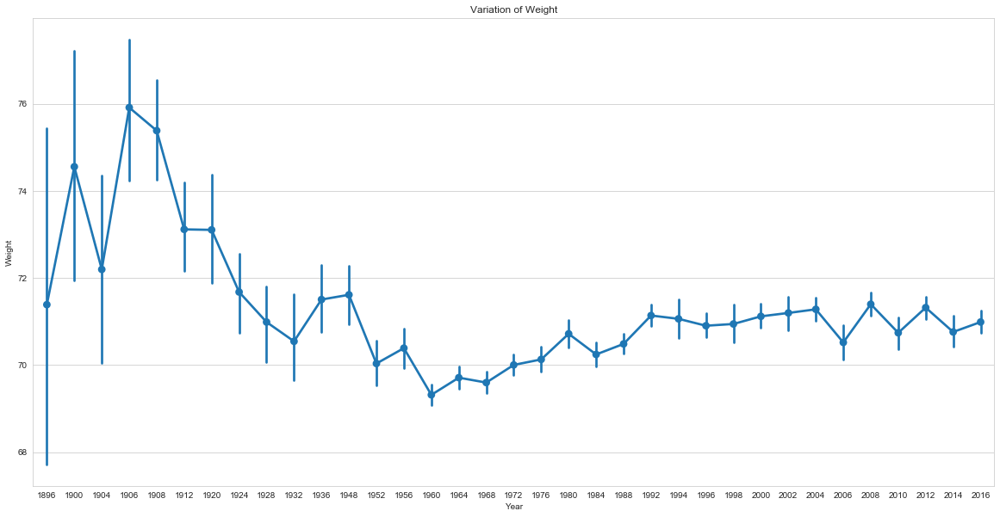

In [79]:
plt.figure(figsize=(20, 10))
sns.pointplot('Year', 'Weight', data=data)
plt.title('Variation of Weight')

Text(0.5, 1.0, 'Variation of Height')

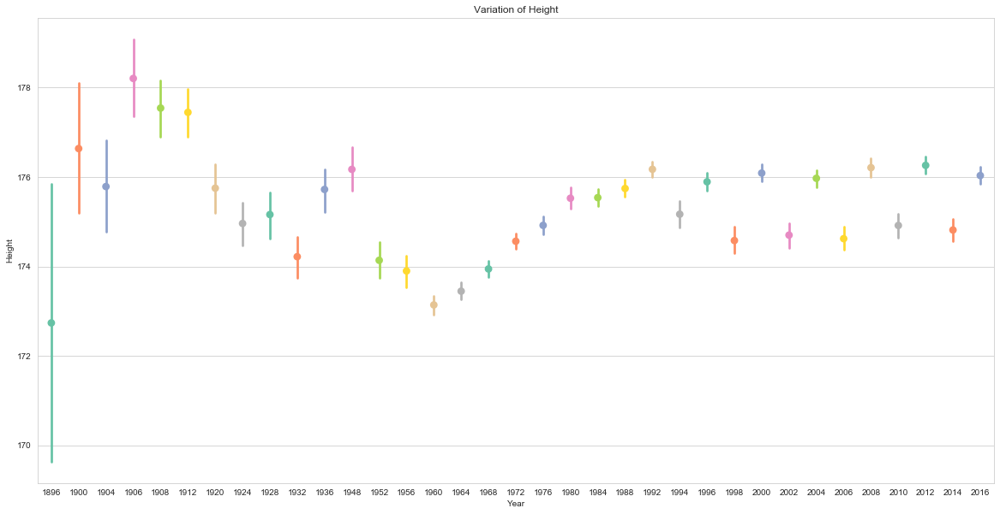

In [80]:
plt.figure(figsize=(20, 10))
sns.pointplot('Year', 'Height', data=data, palette='Set2')
plt.title('Variation of Height')

In [85]:
gold_medal = data[data['Medal']=='Gold']
sports = gold_medal.groupby(['Sport']).size()
top_gold_medal_sports = pd.DataFrame({'Sports':sports.index, 'Count':sports.values})
#Ranking the count of medalled sport branches in descending order.
top_gold_medal_sports.sort_values(['Count', 'Sports'], ascending=[False, True], inplace=True)

print(top_gold_medal_sports.head())

        Sports  Count
5    Athletics   1339
54    Swimming   1099
43      Rowing    978
27  Gymnastics    791
22     Fencing    594


In [86]:
print(gold_medal['Sport'].value_counts(dropna=False).head())

Athletics     1339
Swimming      1099
Rowing         978
Gymnastics     791
Fencing        594
Name: Sport, dtype: int64


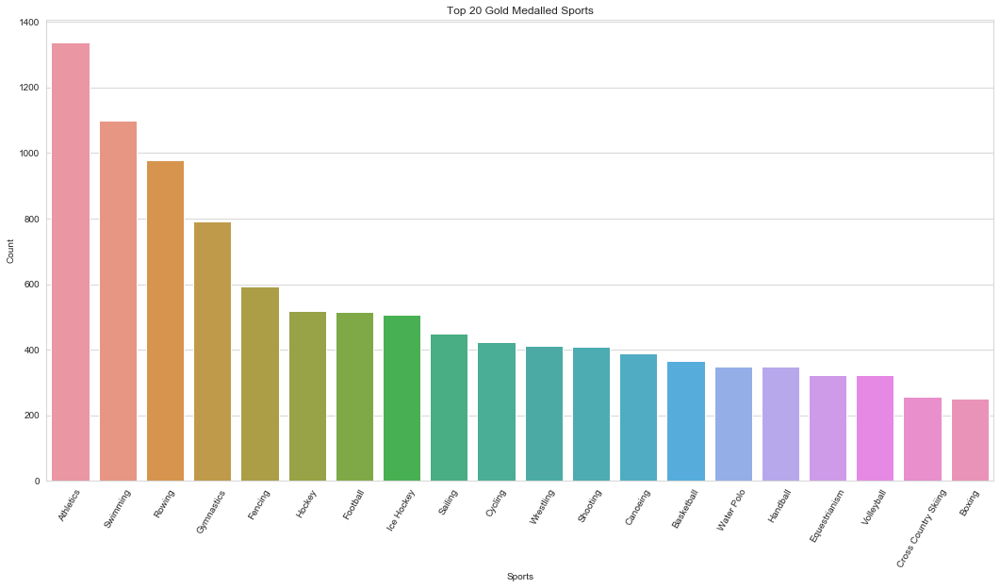

In [87]:
plt.figure(figsize=(18,9))
sns.barplot(x=top_gold_medal_sports['Sports'][:20], y=top_gold_medal_sports['Count'][:20])
plt.xticks(rotation= 60)
#plt.xlabel('Sports')
#plt.ylabel('Gold Medal Count')
plt.title('Top 20 Gold Medalled Sports')

plt.show()

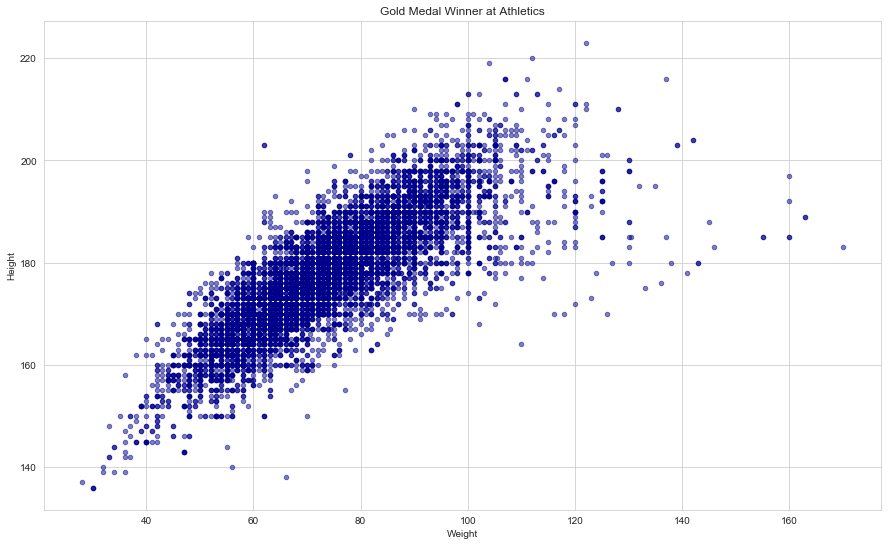

In [88]:
gold_medal.plot(kind='scatter', x='Weight', y='Height', alpha=0.5, color='darkblue', figsize = (15,9))
plt.xlabel='Weight'
plt.ylabel='Height'
plt.title('Gold Medal Winner at Athletics')

plt.show()

In [97]:
data_noc=pd.read_csv("C:/Users/Awanda/Documents/noc_regions.csv")
Teams = data.loc[:,["ID", "NOC"]].drop_duplicates().groupby(["NOC"]).size().reset_index()
Teams.columns = ["NOC", "Count"]
TeamsCountry = pd.merge(Teams,data_noc, on=['NOC','NOC'])

In [98]:
data = [ dict(
        type = 'choropleth',
        locations = TeamsCountry['NOC'],
        locationmode = 'ISO-3',
        z = TeamsCountry['Count'],
        text = TeamsCountry['region'],
        
        colorscale=
            [[0.0, "rgb(251, 237, 235)"],
            [0.09, "rgb(245, 211, 206)"],
            [0.12, "rgb(239, 179, 171)"],
            [0.15, "rgb(236, 148, 136)"], 
            [0.22, "rgb(239, 117, 100)"],
            [0.35, "rgb(235, 90, 70)"],
            [0.45, "rgb(207, 81, 61)"],
            [0.65, "rgb(176, 70, 50)"],
            [0.85, "rgb(147, 59, 39)"],
            [1.00, "rgb(110, 47, 26)"]],
        
        autocolorscale = False,
        reversescale = False,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) 
        ),
        colorbar = dict(
            autotick = False,
            tickprefix = '',
            title = 'Count'),
      ) 
       ]

layout = dict(
    title = "Countries With the Most Teams",
    geo = dict(
        showframe = False,
        showcoastlines = True,
        width=500,height=400
    )
)

w_map = dict(data=data, layout=layout)

iplot( w_map, validate=False)

In [100]:
data.head()

AttributeError: 'list' object has no attribute 'head'

In [101]:
data = pd.read_csv("C:/Users/Awanda/Documents/athlete_events.csv")
data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [103]:
import plotly.figure_factory as ff
data2016=data[(data.Year==2016) & (data.Season=='Summer')]
dt2016 = data2016.loc[:,["Age", "Height", "Weight"]]
dt2016["index"] = np.arange(1,len(dt2016)+1)
# scatter matrix
fig = ff.create_scatterplotmatrix(dt2016.head(200), diag='box', index='index',colormap='Portland',
                                  colormap_type='cat',
                                  height=700, width=700)
iplot(fig)

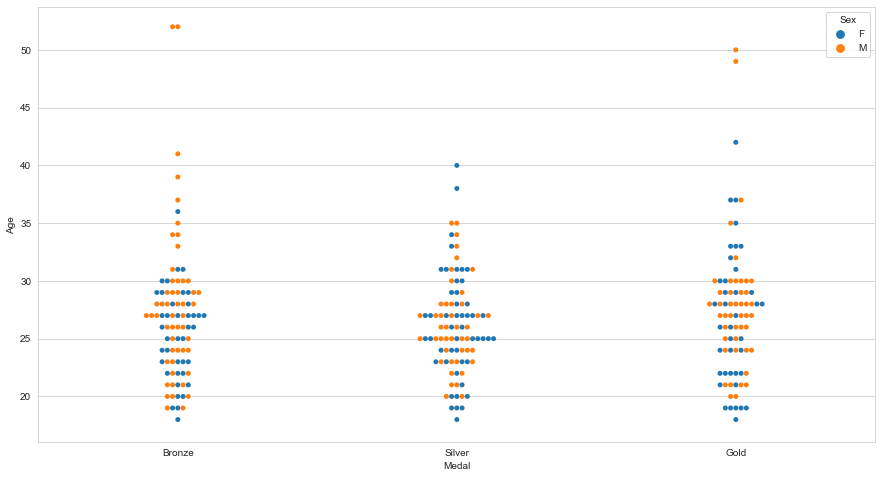

In [104]:
datanew=data2016.head(2000)
fig, ax = plt.subplots(figsize=(15,8))
sns.swarmplot(x="Medal", y="Age",hue="Sex", size=5, data=datanew, ax=ax)
plt.show()

In [106]:
pie1 = data2016.Medal
labels = data2016.Medal.unique()
pie1_list=list(data2016.Medal.value_counts())
# figure
fig = {
  "data": [
    {
      "values": pie1_list,
      "labels": labels,
              "domain": {"x": [0, .75]},
      "name": "Ratio Of Medals",
      "hoverinfo":"label+value+name",
      "hole": .5,
      "type": "pie"
    }],
  "layout": {
        "title":"Medals of 2016 Olympic Games",
        
    }
}
iplot(fig)
